In [1]:
from sklearn import datasets

# Chargement des jeux de données
iris = datasets.load_iris()
wine = datasets.load_wine()
digits = datasets.load_digits()
breast_cancer = datasets.load_breast_cancer()

# Extraction des données et des étiquettes
X_iris, y_iris = iris.data, iris.target
X_wine, y_wine = wine.data, wine.target
X_digits, y_digits = digits.data, digits.target
X_bc, y_bc = breast_cancer.data, breast_cancer.target

In [80]:
import pandas as pd

df_iris = pd.DataFrame(iris.data, columns=iris.feature_names)
df_iris["target"] = iris.target
print(df_iris.head())
df_wine = pd.DataFrame(wine.data, columns=wine.feature_names)
df_digits = pd.DataFrame(digits.data)
df_bc = pd.DataFrame(breast_cancer.data, columns=breast_cancer.feature_names)

# Labels
y_iris = iris.target
y_wine = wine.target
y_digits = digits.target
y_bc = breast_cancer.target

   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)  \
0                5.1               3.5                1.4               0.2   
1                4.9               3.0                1.4               0.2   
2                4.7               3.2                1.3               0.2   
3                4.6               3.1                1.5               0.2   
4                5.0               3.6                1.4               0.2   

   target  
0       0  
1       0  
2       0  
3       0  
4       0  


In [4]:
import numpy as np

np.random.seed(123) 
A = np.random.normal(loc=100, scale=15, size=100000)  
print(A)

[ 83.71554095 114.9601817  104.24467747 ... 117.38249661 134.25618437
  80.22592728]


In [5]:
mean_A = np.mean(A)
var_A = np.var(A)
sd_A = np.std(A)

print("Moyenne empirique   :", mean_A)
print("Variance empirique  :", var_A)
print("Écart-type empirique:", sd_A)

Moyenne empirique   : 100.01972230262723
Variance empirique  : 224.8066211924985
Écart-type empirique: 14.993552654140997


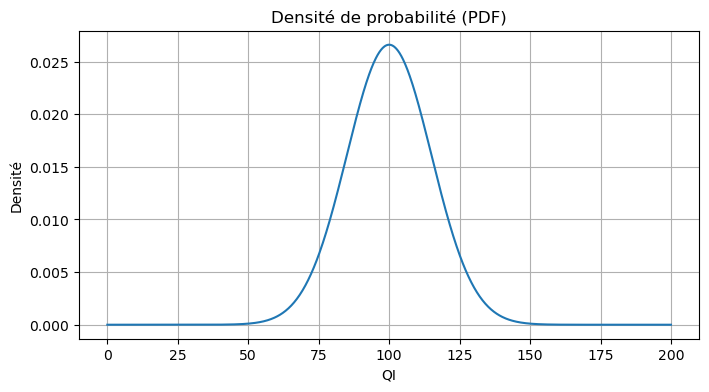

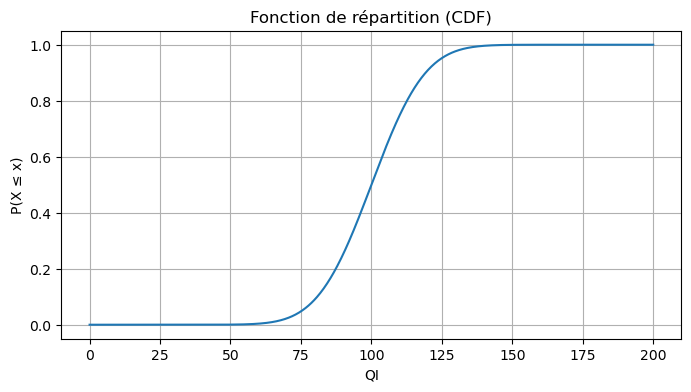

In [89]:
import scipy.stats as st
import matplotlib.pyplot as plt
from scipy import stats  

x = np.linspace(0, 200, 1000)

# PDF (densité)
pdf = st.norm.pdf(x, loc=100, scale=15)

# CDF (fonction de répartition)
cdf = st.norm.cdf(x, loc=100, scale=15)

# ----- Tracé PDF -----
plt.figure(figsize=(8,4))
plt.plot(x, pdf)
plt.title("Densité de probabilité (PDF)")
plt.xlabel("QI")
plt.ylabel("Densité")
plt.grid(True)
plt.show()

# ----- Tracé CDF -----
plt.figure(figsize=(8,4))
plt.plot(x, cdf)
plt.title("Fonction de répartition (CDF)")
plt.xlabel("QI")
plt.ylabel("P(X ≤ x)")
plt.grid(True)
plt.show()

In [15]:
#Extrêmes : P(QI > 130) et P(QI < 60)
p_gt_130_th = 1 - st.norm.cdf(130, 100, 15)
p_lt_60_th  = st.norm.cdf(60, 100, 15)

print("Théorique P(QI > 130) =", p_gt_130_th)
print("Théorique P(QI < 60)  =", p_lt_60_th)

p_gt_130_emp = np.mean(A > 130)
p_lt_60_emp  = np.mean(A < 60)

print("\nEmpirique P(QI > 130) =", p_gt_130_emp)
print("Empirique P(QI < 60)  =", p_lt_60_emp)


Théorique P(QI > 130) = 0.02275013194817921
Théorique P(QI < 60)  = 0.0038303805675897365

Empirique P(QI > 130) = 0.02255
Empirique P(QI < 60)  = 0.00383


In [20]:
#Intervalle 95% populationnel
low_theo, high_theo = st.norm.ppf([0.025, 0.975], 100, 15)
print("Intervalle théorique contenant 95% des QI :", (low_theo, high_theo))
low_emp, high_emp = np.quantile(A, [0.025, 0.975])
print("Intervalle empirique 95% :", (low_emp, high_emp))

#Intervalle de confiance 95% de la moyenne
SE = sd_A / np.sqrt(100000)
IC95 = (mean_A - 1.96*SE, mean_A + 1.96*SE)

print("Erreur standard :", SE)
print("IC95 de la moyenne :", IC95)

#Un IC95 quantifie l'incertitude sur le PARAMÈTRE μ estimé alors que l'intervalle populationnel décrit la DISPERSION des valeurs individuelles

Intervalle théorique contenant 95% des QI : (np.float64(70.60054023189917), np.float64(129.39945976810083))
Intervalle empirique 95% : (np.float64(70.7728654058954), np.float64(129.35341679214403))
Erreur standard : 0.04741377660474838
IC95 de la moyenne : (np.float64(99.92679130048192), np.float64(100.11265330477254))


In [24]:
#standarisation 
Z = (A - mean_A) / sd_A

mean_Z = np.mean(Z)
var_Z = np.var(Z) 
sd_Z = np.std(Z)

print(f"Moyenne de Z : {mean_Z}")
print(f"Variance de Z : {var_Z}")
print(f"Écart-type de Z : {sd_Z}")


Moyenne de Z : -9.85238557404955e-16
Variance de Z : 1.0
Écart-type de Z : 1.0


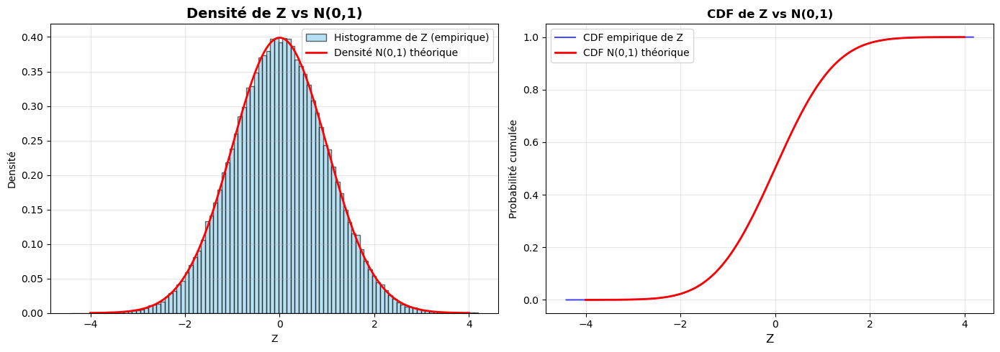

In [35]:
#  Courbes de densité et CDF
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Densité
axes[0].hist(Z, bins=100, density=True, alpha=0.6, color='skyblue', 
             edgecolor='black', label='Histogramme de Z (empirique)')
z_vals = np.linspace(-4, 4, 1000)
axes[0].plot(z_vals, st.norm.pdf(z_vals, 0, 1), 'r-', linewidth=2, 
             label='Densité N(0,1) théorique')
axes[0].set_xlabel('Z')
axes[0].set_ylabel('Densité')
axes[0].set_title('Densité de Z vs N(0,1)', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)
# CDF
z_sorted = np.sort(Z)
cdf_empirique = np.arange(1, len(Z)+1) / len(Z)
axes[1].plot(z_sorted, cdf_empirique, linewidth=1.5, alpha=0.7, 
             label='CDF empirique de Z', color='blue')
axes[1].plot(z_vals, st.norm.cdf(z_vals, 0, 1), 'r-', linewidth=2, 
             label='CDF N(0,1) théorique')
axes[1].set_xlabel('Z', fontsize=12)
axes[1].set_ylabel('Probabilité cumulée')
axes[1].set_title('CDF de Z vs N(0,1)', fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()
# les deux courbes se ressemblent, alors Z ≈ N(0,1).

In [31]:
# Intervalle restreint (QI entre 120 et 125)

# Transformation en scores Z
z_120 = (120 - mean_A) / sd_A
z_125 = (125 - mean_A) / sd_A

print(f"QI = 120 correspond à Z = {z_120}")
print(f"QI = 125 correspond à Z = {z_125}")

# Probabilité théorique via CDF de N(0,1)
p_theo = st.norm.cdf(z_125, 0, 1) - st.norm.cdf(z_120, 0, 1)

# Probabilité empirique
p_emp = np.mean((A > 120) & (A < 125))

print(f"Probabilité théorique : {p_theo:.6f} ({p_theo*100}%)")
print(f"Probabilité empirique  : {p_emp:.6f} ({p_emp*100}%)")
print(f"Écart absolu           : {abs(p_theo - p_emp)}")

QI = 120 correspond à Z = 1.3325912916212366
QI = 125 correspond à Z = 1.6660679609160933
Probabilité théorique : 0.043483 (4.34830427279106%)
Probabilité empirique  : 0.043320 (4.332%)
Écart absolu           : 0.00016304272791059504


[ 94.30401813 104.72274863  95.67628827 102.51617745 100.84936092
 116.91005631 101.53109385  88.31730459  95.65670017  91.68284848
  92.99483517 104.78997155 104.24166835 108.07754791 112.30450172
  73.89170893  68.39212621 131.74025926 114.42880892  97.11884831
 102.89946568  95.59192058  87.24227197  89.54317897 111.18133532
  88.52259288 109.87139112  97.95960296  89.39601921 106.7242946
  76.41338311 105.11124934 101.56565974 109.3139304  103.87454992
  94.07817137  98.39418253  96.60662391  90.45426864 107.91773009
  88.11485214  86.17256981 110.73851539  69.02291351  95.41549738
 105.37528362  72.98903759 110.52429052  88.30807842 119.35894729
  95.67156782  75.32998965 101.49560757 125.21530739 113.23411869
  82.436035    97.2468511  125.58210396  88.49185649  99.72216079
 121.55976281 108.62585578  98.33573101 110.6483347   88.40115268
  83.22430845  99.20312854 115.66122393 110.10140649 106.93425545
 105.74406891  91.86950451  91.846727   102.39183035 119.92235614
  95.208547

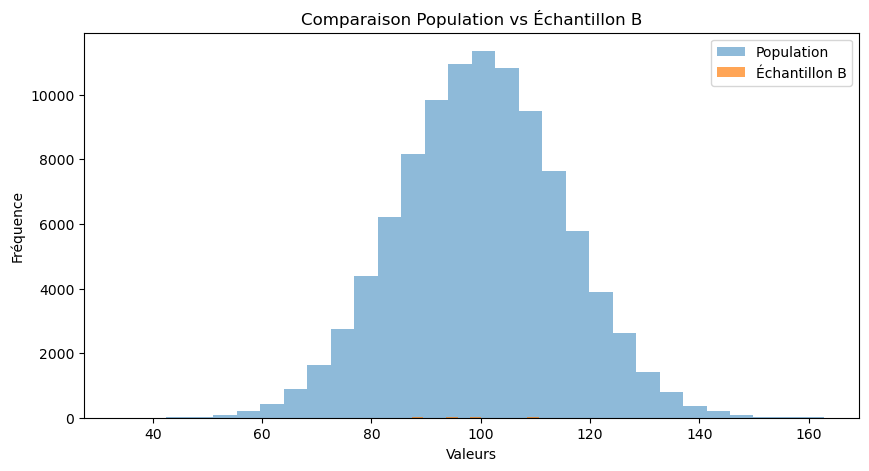

In [42]:
B = np.random.normal(loc=100, scale=15, size=100)  
print(B)
plt.figure(figsize=(10,5))
plt.hist(A, bins=30, alpha=0.5, label='Population')
plt.hist(B, bins=30, alpha=0.7, label='Échantillon B')
plt.xlabel('Valeurs')
plt.ylabel('Fréquence')
plt.title('Comparaison Population vs Échantillon B')
plt.legend()
plt.show()

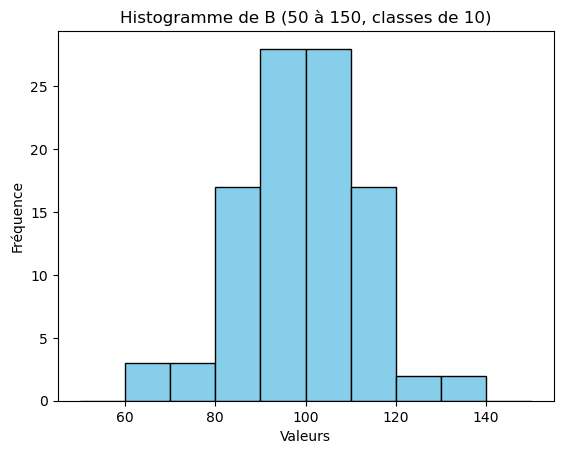

In [40]:
#histogramme
bins = np.arange(50, 160, 10)
plt.hist(B, bins=bins, color='skyblue', edgecolor='black')
plt.xlabel('Valeurs')
plt.ylabel('Fréquence')
plt.title('Histogramme de B (50 à 150, classes de 10)')
plt.show()


In [44]:
# IC95 de la moyenne
mean_B = np.mean(B)
var_B = np.var(B, ddof=1)  
n = len(B)
se = np.sqrt(var_B / n) 
IC95 = st.t.interval(0.95, df=n-1, loc=mean_B, scale=se)

print(f"Moyenne de B: {mean_B}")
print(f"Variance de B: {var_B}")
print(f"IC95 de la moyenne: [{IC95[0]}, {IC95[1]}]")

Moyenne de B: 99.2591280060571
Variance de B: 184.6973907553453
IC95 de la moyenne: [96.56250934466536, 101.95574666744884]


1.4 Distribution des moyennes d’´echantillons

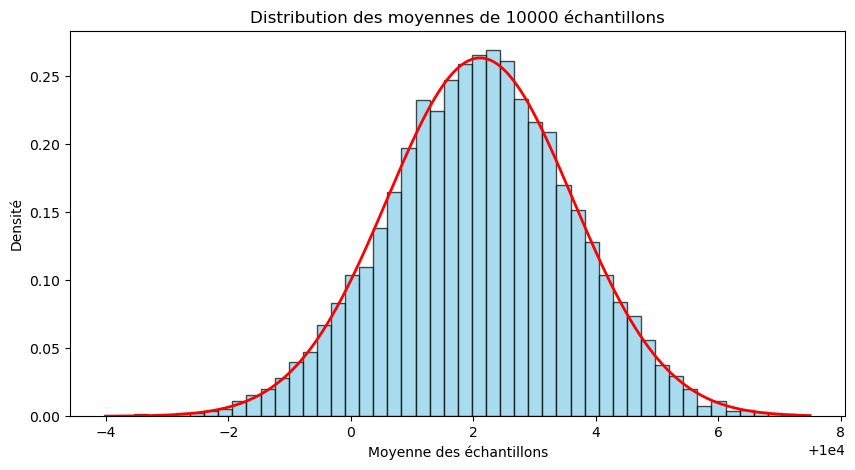

In [57]:
# Simulation du TCL
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st

# Échantillon initial
echantillons = np.random.normal(loc=10000, scale=15, size=100)

# Simulation des moyennes
means = []
for i in range(10000):
    s = np.random.choice(echantillons, 100, replace=True)
    means.append(np.mean(s))

means = np.array(means)

# Calcul des paramètres de la normale des moyennes
mu = np.mean(means)
sigma = np.std(means)

# Histogramme des moyennes
plt.figure(figsize=(10,5))
plt.hist(means, bins=50, density=True, alpha=0.7, color='skyblue', edgecolor='black')

# Densité normale superposée
x = np.linspace(min(means), max(means), 1000)
plt.plot(x, st.norm.pdf(x, mu, sigma), 'r', lw=2)

plt.xlabel('Moyenne des échantillons')
plt.ylabel('Densité')
plt.title('Distribution des moyennes de 10000 échantillons')
plt.show()


In [66]:

# Erreur standard empirique
ES_sim = np.std(means)
print("Écart-type des moyennes simulées :", ES_sim)
erreur_b=np.std(B)
print("ecart type B ",erreur_b)

#L’écart-type des moyennes est beaucoup plus petit que celui de l’échantillon initial
#le Théorème Central Limite : plus la taille des échantillons est grande
#plus les moyennes sont concentrées autour de la vraie moyenne
#donc l’écart-type des moyennes diminue.

Écart-type des moyennes simulées : 1.5155729293197453
ecart type B  13.522219375819631


In [67]:
IC95_sim = np.percentile(means, [2.5, 97.5])
print("Intervalle 95% des moyennes simulées :", IC95_sim)
#

Intervalle 95% des moyennes simulées : [ 9999.0920079  10005.03208703]


In [68]:
malnutris = np.array([95, 109, 99, 83, 113, 86, 101, 92, 96, 106])
moyenne_malnutris = np.mean(malnutris)
print("Moyenne du petit échantillon :", moyenne_malnutris)
#Le Théorème Central Limite fonctionne quand l’échantillon est assez grand (souvent n ≥ 30)

Moyenne du petit échantillon : 98.0


In [74]:
import pandas as pd

Y = pd.read_csv('malnutrition.csv')
print(Y.head())
moy_Y = Y['Y'].mean()
ecart_Y = Y['Y'].std()
print("Moyenne Y :", moy_Y)
print("Écart-type Y :", ecart_Y)

moy_B = np.mean(B)
ecart_B = np.std(B)
print("Moyenne B :", moy_B)
print("Écart-type B :", ecart_B)


            Y
0  295.370962
1  309.649534
2  302.709104
3   90.916017
4  104.215923
Moyenne Y : 61.8430001543752
Écart-type Y : 66.81184498793677
Moyenne B : 99.2591280060571
Écart-type B : 13.522219375819631


2 Deuxi`emepartie : R´eduction de dimension (fonction d’analyse multivari´ee)

Principe bootstrap: on simule plusieurs échantillons à partir de l’échantillon existant pour voir comment la statistique varie.

In [97]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as ADL
from itertools import combinations
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


def analyser(df, labels=None, bootstrap=False, n_boot=100):
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(df)

    print("Nombre d'observations:", df.shape[0])
    print("Nombre de variables:", df.shape[1])

    for c in df.columns:
        x = df[c].dropna()
        mean = np.mean(x)
        if bootstrap:
            means_boot = [np.mean(np.random.choice(x, size=len(x), replace=True)) for _ in range(n_boot)]
            ic95 = np.percentile(means_boot, [2.5, 97.5])
        else:
            se = np.std(x, ddof=1) / np.sqrt(len(x))
            ic95 = [mean - 1.96*se, mean + 1.96*se]
        print(f"{c}: moyenne={mean}, IC95={ic95}")

    # Histogrammes
    df.hist(bins=15, figsize=(15, 5))
    plt.suptitle("Histogrammes des variables")
    plt.show()
    print("\nIC95 souvent suffisant : donne une idée de la dispersion donc afficher moyennes/variances séparément devient souvent redondant.")

    pairs = list(combinations(df.columns, 2))
    n_pairs = len(pairs)
    ncols = 3
    nrows = int(np.ceil(n_pairs / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*5, nrows*4))
    axes = axes.flatten()

    for i, (x_col, y_col) in enumerate(pairs):
        x = df[x_col]
        y = df[y_col]
        axes[i].scatter(x, y, alpha=0.7)
        # R2
        slope, intercept, r_value, p_value, std_err = st.linregress(x, y)
        R2 = r_value**2
        axes[i].plot(x, intercept + slope*x, 'r')
        axes[i].set_xlabel(x_col)
        axes[i].set_ylabel(y_col)
        axes[i].set_title(f"R²={R2:.2f}")

    plt.tight_layout()
    plt.show()

    print("R² et droite de régression suffisent pour décrire complètement la liaison linéaire : R² indique la proportion de variance expliquée et la droite donne la relation précise.")

    if labels is None:
        # ACP
        pca = PCA()
        X_pca = pca.fit_transform(X_scaled)
        var_explained = pca.explained_variance_ratio_
        print("Variance expliquée par les axes :", var_explained[:5])
        plt.figure(figsize=(8, 6))
        plt.scatter(X_pca[:,0], X_pca[:,1])
        plt.xlabel(f"PC1 ({var_explained[0]*100:.2f}% var)")
        plt.ylabel(f"PC2 ({var_explained[1]*100:.2f}% var)")
        plt.title("Projection ACP")
        plt.show()
    else:
        # ADL
        lda = ADL()
        X_lda = lda.fit_transform(X_scaled, labels)
        plt.figure(figsize=(8, 6))
        for label in np.unique(labels):
            plt.scatter(X_lda[labels==label,0], X_lda[labels==label,0], label=label)
        plt.xlabel("Composante discriminante 1")
        plt.ylabel("Composante discriminante 2")
        plt.title("Projection ADL")
        plt.legend()
        plt.show()

    if labels is None:
        pcs = pca.components_[:2, :]
        plt.figure(figsize=(6, 6))
        for i, var in enumerate(df.columns):
            plt.arrow(0, 0, pcs[0,i], pcs[1,i], color='r', alpha=0.7)
            plt.text(pcs[0,i]*1.15, pcs[1,i]*1.15, var, color='b', ha='center', va='center')
        plt.xlim(-1, 1)
        plt.ylim(-1, 1)
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.title("Cercle des corrélations")
        plt.grid()
        plt.show()



===== Analyse du dataset Iris =====
Nombre d'observations: 150
Nombre de variables: 5
sepal length (cm): moyenne=5.843333333333334, IC95=[5.71663333 5.9787    ]
sepal width (cm): moyenne=3.0573333333333337, IC95=[2.984   3.12535]
petal length (cm): moyenne=3.7580000000000005, IC95=[3.47133333 4.04743333]
petal width (cm): moyenne=1.1993333333333336, IC95=[1.078      1.32266667]
target: moyenne=1.0, IC95=[0.86666667 1.12      ]


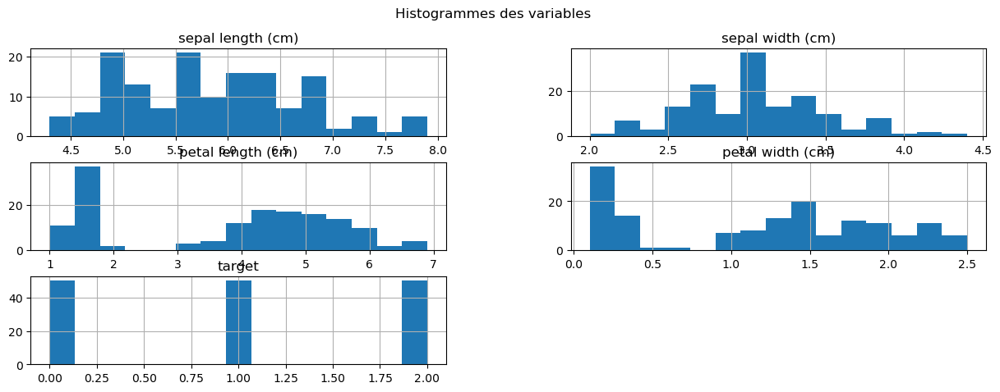


IC95 souvent suffisant : donne une idée de la dispersion donc afficher moyennes/variances séparément devient souvent redondant.


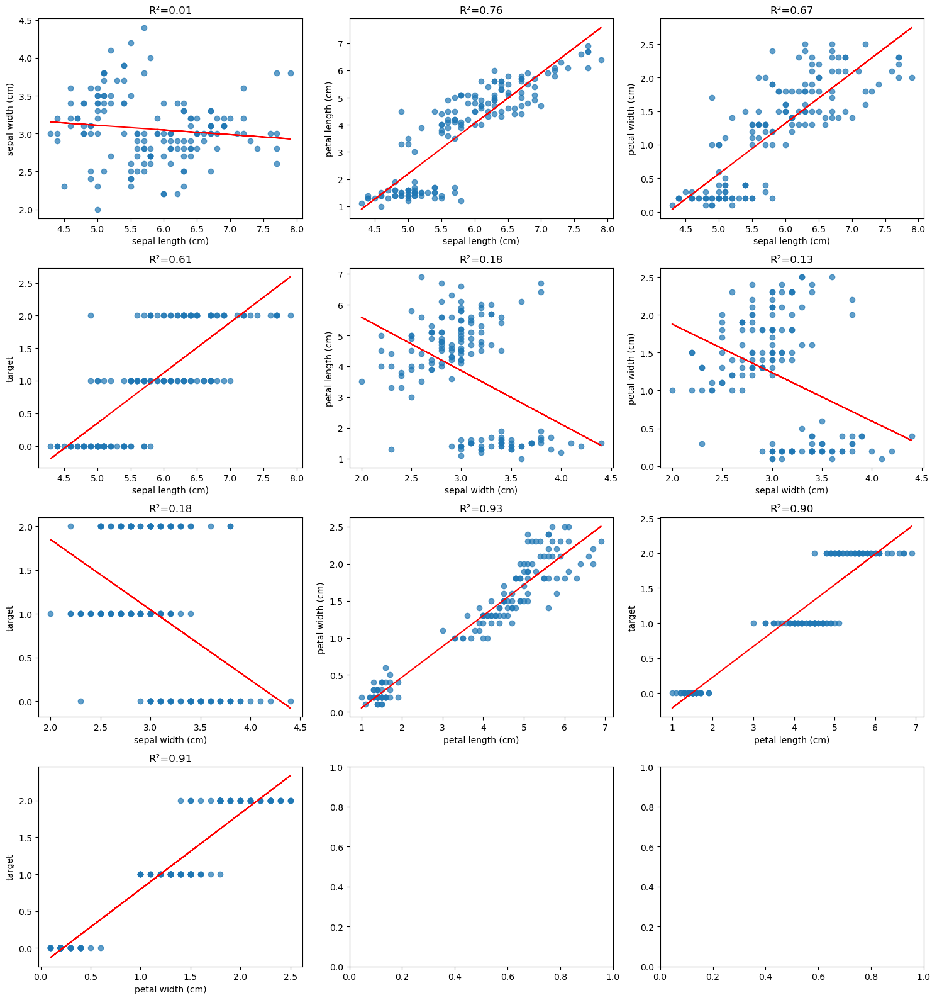

R² et droite de régression suffisent pour décrire complètement la liaison linéaire : R² indique la proportion de variance expliquée et la droite donne la relation précise.


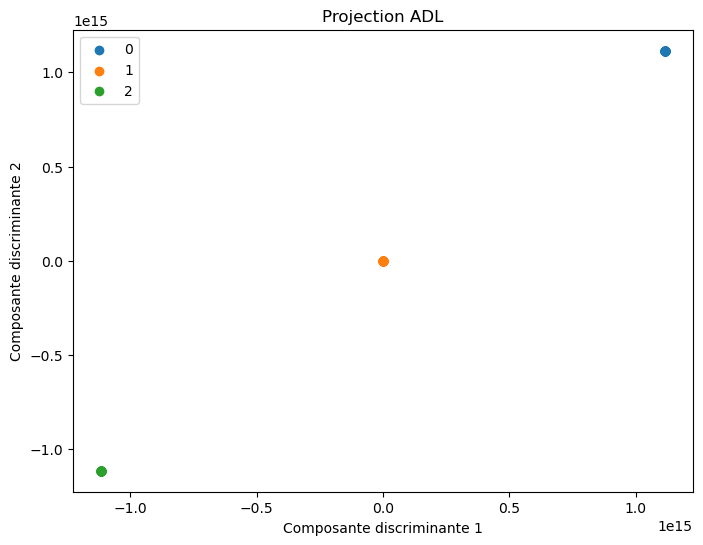


===== Analyse du dataset Wine =====
Nombre d'observations: 178
Nombre de variables: 13
alcohol: moyenne=13.00061797752809, IC95=[12.87583146 13.11069663]
malic_acid: moyenne=2.3363483146067416, IC95=[2.17924298 2.50676264]
ash: moyenne=2.3665168539325845, IC95=[2.32924438 2.40556742]
alcalinity_of_ash: moyenne=19.49494382022472, IC95=[19.0140309  19.98657303]
magnesium: moyenne=99.74157303370787, IC95=[ 97.68525281 101.75294944]
total_phenols: moyenne=2.295112359550562, IC95=[2.19375421 2.38472472]
flavanoids: moyenne=2.0292696629213487, IC95=[1.8854986  2.16923455]
nonflavanoid_phenols: moyenne=0.3618539325842696, IC95=[0.34454073 0.38039466]
proanthocyanins: moyenne=1.5908988764044945, IC95=[1.50636938 1.67118258]
color_intensity: moyenne=5.058089882022472, IC95=[4.74894803 5.40861938]
hue: moyenne=0.9574494382022471, IC95=[0.9246514  0.99073034]
od280/od315_of_diluted_wines: moyenne=2.6116853932584267, IC95=[2.50651545 2.71045787]
proline: moyenne=746.8932584269663, IC95=[702.04227

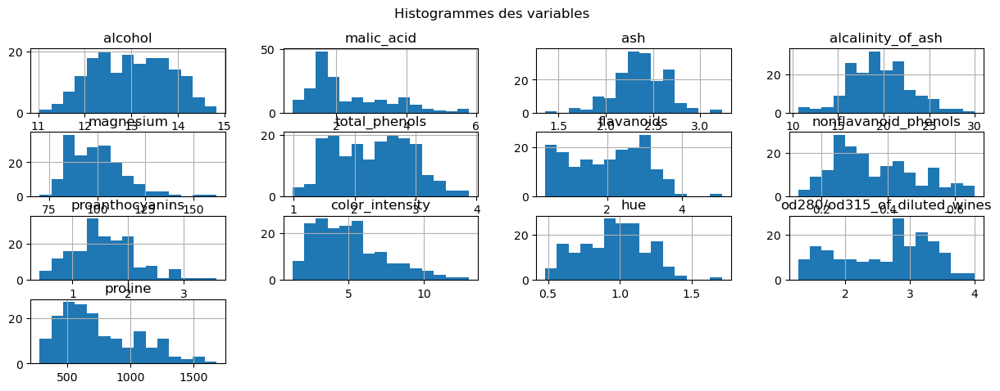


IC95 souvent suffisant : donne une idée de la dispersion donc afficher moyennes/variances séparément devient souvent redondant.


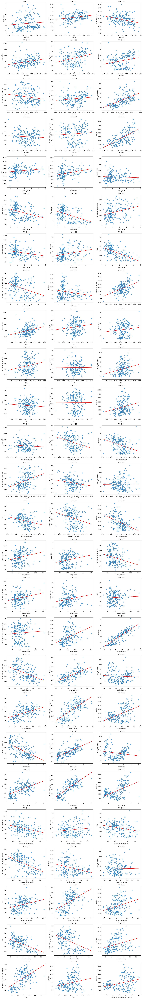

R² et droite de régression suffisent pour décrire complètement la liaison linéaire : R² indique la proportion de variance expliquée et la droite donne la relation précise.


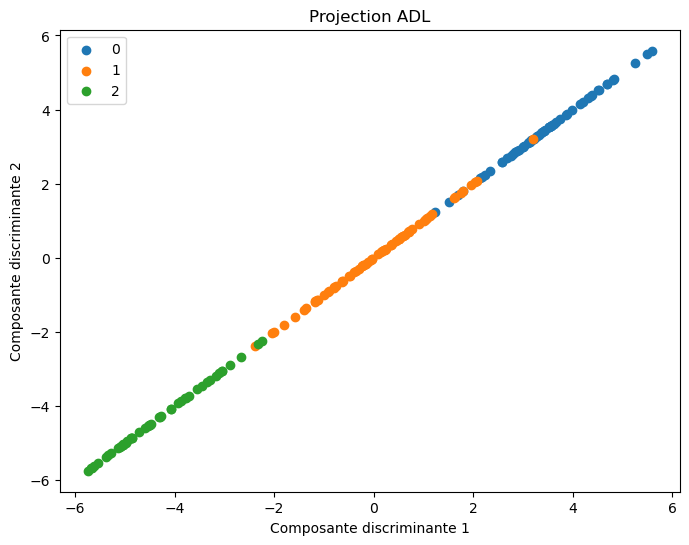


===== Analyse du dataset Digits =====
Nombre d'observations: 1797
Nombre de variables: 64
0: moyenne=0.0, IC95=[0. 0.]
1: moyenne=0.3038397328881469, IC95=[0.26265999 0.35005565]
2: moyenne=5.204785754034502, IC95=[4.99109627 5.42909015]
3: moyenne=11.835837506956038, IC95=[11.63484975 12.0361714 ]
4: moyenne=11.848080133555927, IC95=[11.6376739  12.04008069]
5: moyenne=5.781858653311074, IC95=[5.51297997 6.06156093]
6: moyenne=1.3622704507512522, IC95=[1.21144964 1.53537841]
7: moyenne=0.1296605453533667, IC95=[0.08180301 0.17807457]
8: moyenne=0.005564830272676683, IC95=[0.00166945 0.01001669]
9: moyenne=1.9938786867000557, IC95=[1.85306066 2.14589594]
10: moyenne=10.382303839732888, IC95=[10.11065665 10.61213133]
11: moyenne=11.979410127991097, IC95=[11.7963133  12.16035058]
12: moyenne=10.279354479688369, IC95=[10.05340846 10.49592376]
13: moyenne=8.175848636616584, IC95=[7.90534224 8.46634669]
14: moyenne=1.8464106844741235, IC95=[1.69162493 2.0078325 ]
15: moyenne=0.107957707289

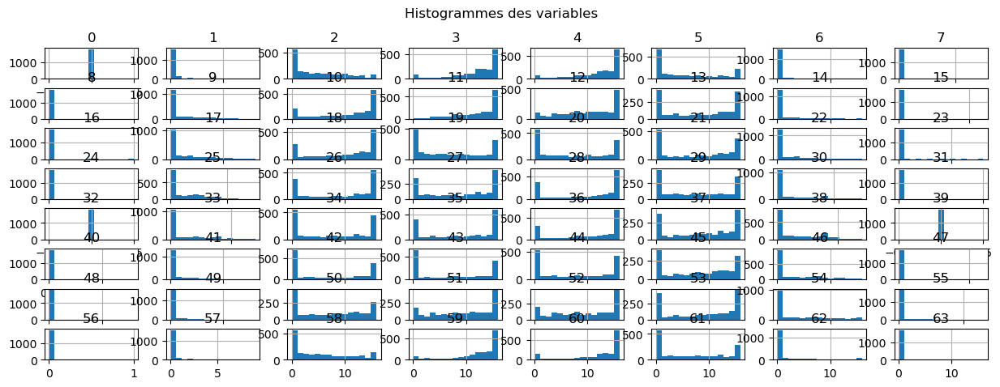


IC95 souvent suffisant : donne une idée de la dispersion donc afficher moyennes/variances séparément devient souvent redondant.


ValueError: Cannot calculate a linear regression if all x values are identical

In [98]:
def tester_dataset(df, labels=None, nom="Dataset"):
    print(f"\n===== Analyse du dataset {nom} =====")
    analyser(df, labels=labels, bootstrap=True, n_boot=1000)

# Test avec Iris
tester_dataset(df_iris, labels=y_iris, nom="Iris")

# Test avec Wine
tester_dataset(df_wine, labels=y_wine, nom="Wine")

# Test avec Digits
tester_dataset(df_digits, labels=y_digits, nom="Digits")

# Test avec Breast Cancer
tester_dataset(df_bc, labels=y_bc, nom="Breast Cancer")